<a href="https://colab.research.google.com/github/725ps/YOLOv8-DeepSORT-Object-Tracking/blob/main/YOLOv8_Detection_Tracking_CustomData_Complete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Before Running the Script Please Make Sure you Select the Run Time as GPU

#**Import the Required Libraries**

In [1]:
from IPython.display import Image
import numpy as np

#**Clone the Github Repo**

In [2]:
!git clone https://github.com/MuhammadMoinFaisal/YOLOv8-DeepSORT-Object-Tracking.git

Cloning into 'YOLOv8-DeepSORT-Object-Tracking'...
remote: Enumerating objects: 403, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 403 (delta 21), reused 19 (delta 19), pack-reused 370 (from 1)
Receiving objects: 100% (403/403), 77.99 MiB | 25.65 MiB/s, done.
Resolving deltas: 100% (206/206), done.


In [3]:
!pwd

/content


##Setting the Current Directory

In [4]:
%cd /content/YOLOv8-DeepSORT-Object-Tracking

/content/YOLOv8-DeepSORT-Object-Tracking


In [5]:
!pip install -e '.[dev]'

Obtaining file:///content/YOLOv8-DeepSORT-Object-Tracking
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 72.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 58.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 

##Install all the Dependencies

##Moving to the Required Directory

In [1]:
%cd /content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect

/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect


##Importing the Dataset from the RoboFlow

In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="84ebcGaBMzZE4F5jsRng")
project = rf.workspace("shreks-swamp").project("coco-dataset-limited--person-only")
dataset = project.version(1).download("yolov5")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 116.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to COCO-Dataset-Limited-(Person-Only)-1 in yolov5pytorch:: 100%|██████████| 10498/10498 [00:01<00:00, 7544.90it/s]


##To implement the DeepSORT tracking, downloading the required files

In [3]:
!gdown "https://drive.google.com/uc?id=11ZSZcG-bcbueXZC3rN08CM0qqX3eiHxf&confirm=t"


Downloading...
From: https://drive.google.com/uc?id=11ZSZcG-bcbueXZC3rN08CM0qqX3eiHxf&confirm=t
To: /content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/deep_sort_pytorch.zip
100% 43.1M/43.1M [00:00<00:00, 57.9MB/s]


##Unzipping the DeepSORT Files

In [4]:
!unzip 'deep_sort_pytorch.zip'

Archive:  deep_sort_pytorch.zip
  inflating: deep_sort_pytorch/.gitignore  
   creating: deep_sort_pytorch/configs/
  inflating: deep_sort_pytorch/configs/deep_sort.yaml  
   creating: deep_sort_pytorch/deep_sort/
  inflating: deep_sort_pytorch/deep_sort/__init__.py  
   creating: deep_sort_pytorch/deep_sort/__pycache__/
  inflating: deep_sort_pytorch/deep_sort/__pycache__/__init__.cpython-310.pyc  
  inflating: deep_sort_pytorch/deep_sort/__pycache__/__init__.cpython-37.pyc  
  inflating: deep_sort_pytorch/deep_sort/__pycache__/__init__.cpython-38.pyc  
  inflating: deep_sort_pytorch/deep_sort/__pycache__/deep_sort.cpython-310.pyc  
  inflating: deep_sort_pytorch/deep_sort/__pycache__/deep_sort.cpython-37.pyc  
  inflating: deep_sort_pytorch/deep_sort/__pycache__/deep_sort.cpython-38.pyc  
   creating: deep_sort_pytorch/deep_sort/deep/
 extracting: deep_sort_pytorch/deep_sort/deep/__init__.py  
   creating: deep_sort_pytorch/deep_sort/deep/__pycache__/
  inflating: deep_sort_pytorch/d

#**Training the Custom Model**

In [5]:
HOME = '/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect'

In [6]:
%cd {HOME}

/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect


In [28]:
%cd /content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/COCO-Dataset-Limited-Person-Only-1

/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/COCO-Dataset-Limited-Person-Only-1


In [15]:
mv "/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/COCO-Dataset-Limited-(Person-Only)-1" "/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/COCO-Dataset-Limited-Person-Only-1"


In [30]:
%cd {HOME}

!python train.py model=yolov8x.pt data="/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/COCO-Dataset-Limited-Person-Only-1/data.yaml" epochs=50 imgsz=640


Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(self.amp):
      40/50      14.9G     0.8619     0.6389      1.101        106        640:  69% 161/233 [00:33<00:14,  4.84it/s]/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/engine/trainer.py:290: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(self.amp):
      40/50      14.9G     0.8616     0.6386        1.1        135        640:  70% 162/233 [00:34<00:14,  4.91it/s]/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/engine/trainer.py:290: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(self.amp):
      40/50      14.9G     0.8615     0.6386        1.1        125        640:  70% 163/233 [00:34<00:14,  4.95it/s]/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/engine/tr

#**Checking the Files inside the Train Folder**

In [31]:
!ls /content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train10

args.yaml					     F1_curve.png  R_curve.png
confusion_matrix.png				     P_curve.png   results.csv
events.out.tfevents.1743626888.adcf69f18e6b.52131.0  PR_curve.png  weights


#**Printing the Confusion Matrix**

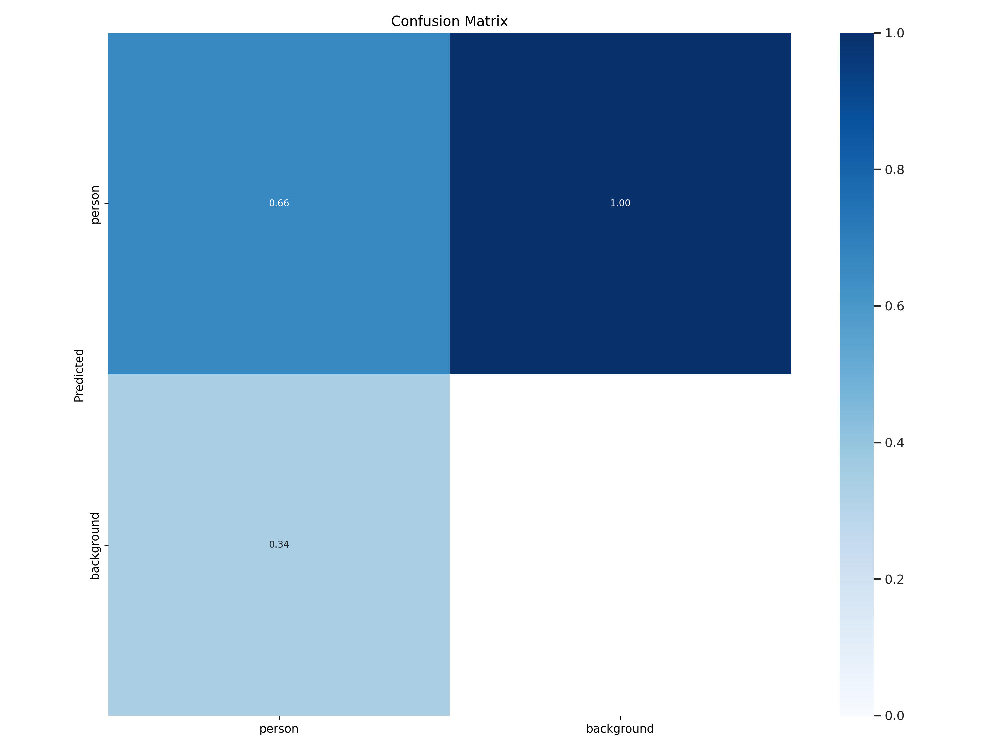

In [32]:
from IPython.display import Image, display

# Display the image inline
display(Image(filename='/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train10/confusion_matrix.png'))


In [ ]:
!df -h

Filesystem      Size  Used Avail Use% Mounted on
overlay         236G   43G  193G  19% /
tmpfs            64M     0   64M   0% /dev
shm             5.7G  4.0K  5.7G   1% /dev/shm
/dev/root       2.0G  1.2G  820M  59% /usr/sbin/docker-init
tmpfs           6.4G  2.5M  6.4G   1% /var/colab
/dev/sda1       242G   70G  173G  29% /kaggle/input
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware


In [ ]:
#!mkdir -p /content/colab_vm/my_models
!cp /content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train/weights/best.pt /content/colab_vm/my_models/best.pt


#**Printing the Training and the Validation Loss**

In [ ]:
#Image(filename = r'/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train/results.png', width = 600)
from IPython.display import Image, display

# Display the image inline with a width of 600 pixels
display(Image(filename=r'/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train/results.png', width=600))

FileNotFoundError: [Errno 2] No such file or directory: '/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train/results.png'

#**Printing the Model Prediction on Validation Batch**

In [ ]:
Image(filename = r'/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train2/val_batch2_pred.jpg', width =600)

FileNotFoundError: [Errno 2] No such file or directory: '/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train2/val_batch2_pred.jpg'

#**Downloading the Weights From the Google Drive**"


In [ ]:
%cd {HOME}

/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect


In [ ]:
!gdown "https://drive.google.com/uc?id=1VBAZtJ5uJMEsnyya_d0yMP6efBRQ8IX-&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1VBAZtJ5uJMEsnyya_d0yMP6efBRQ8IX-&confirm=t
To: /content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/best.pt
100% 87.7M/87.7M [00:02<00:00, 33.0MB/s]


#**Validate Custom Model**

In [ ]:
!pwd

/content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect


In [ ]:
!python val.py model='best.pt' data={dataset.location}/data.yaml

2025-03-22 12:18:16.936246: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742645896.957348   74713 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742645896.963901   74713 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-22 12:18:16.985946: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Ultralytics YOLOv8.0.3 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Fusing layers... 
Model summary: 268 la

#**Inference with Custom Model**

#**Demo Video 1**

In [ ]:
!gdown "https://drive.google.com/uc?id=1UUZUS76ylH5RjMSc9s4rITSYDTG5AHt0&confirm=t"


Downloading...
From: https://drive.google.com/uc?id=1UUZUS76ylH5RjMSc9s4rITSYDTG5AHt0&confirm=t
To: /content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/test4.mp4
100% 7.96M/7.96M [00:00<00:00, 15.8MB/s]


In [ ]:
!python predict.py model='best.pt' source='test4.mp4'

[2025-03-22 12:25:27,421][root.tracker][INFO] - Loading weights from deep_sort_pytorch/deep_sort/deep/checkpoint/ckpt.t7... Done!
2025-03-22 12:25:27.887222: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742646327.921357   76596 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742646327.932004   76596 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-22 12:25:27.968665: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler fl

#**Display the Demo Video**

In [ ]:
!rm "/content/result_compressed.mp4"

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train6/test4.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#**Demo Video 2**

In [ ]:
!gdown "https://drive.google.com/uc?id=1wQXMEiq9txLsTnGFLXsUFbhlsMhoRPcA"


Downloading...
From: https://drive.google.com/uc?id=1wQXMEiq9txLsTnGFLXsUFbhlsMhoRPcA
To: /content/YOLOv8-DeepSORT-Object-Tracking/ultralytics/yolo/v8/detect/ps_test_1.mp4
100% 5.68M/5.68M [00:00<00:00, 17.5MB/s]


In [34]:
!python predict.py model='/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train10/weights/best.pt' source='ps_test_1.mp4'

[2025-04-02 21:46:07,215][root.tracker][INFO] - Loading weights from deep_sort_pytorch/deep_sort/deep/checkpoint/ckpt.t7... Done!
2025-04-02 21:46:07.533177: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-02 21:46:07.550328: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743630367.569999   72531 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743630367.577321   72531 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-02 21

#**Display the Demo Video**

In [35]:
!rm "/content/result_compressed.mp4"

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [36]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/YOLOv8-DeepSORT-Object-Tracking/runs/detect/train11/ps_test_1.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)